# Business Objective:
The **Consumer finance company** wants to understand the driving factors (or driver variables) behind loan default(**Defaulters are applicants who have not paid the instalments in due time for a long period of time**), i.e. the variables which are strong indicators of default.So, that the company can utilise this knowledge for its portfolio and risk assessment. 

# Step 1 : Data Laoding

In [3]:
#Load the necessary Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#isetting the below options inorder to view all rows & columns 
pd.set_option('max_row', 200)
pd.set_option('max_column', 200)
# We need to set this inorder to convert scientific values
pd.options.display.float_format = '{:.2f}'.format 
# Inorder to Ignore warnings due to version problems we have to set the below property
import warnings
warnings.filterwarnings('ignore')

In [4]:
#Load the dataset
# we are using low_memory as False to load columns with multiple data types.
loans_data = pd.read_csv('loan.csv', low_memory=False)
#check the first five rows.
loans_data.head()
#check last five rows
loans_data.tail()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
39712,92187,92174,2500,2500,1075.00,36 months,8.07%,78.42,A,A4,FiSite Research,4 years,MORTGAGE,110000.00,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Our current gutter system on our home is old a...,home_improvement,Home Improvement,802xx,CO,11.33,0,Nov-90,0,0.00,0.00,13,0,7274,13.10%,40,f,0.00,0.00,2822.97,1213.88,2500.00,322.97,0.00,0.00,0.00,Jul-10,80.90,NaN,Jun-10,NaN,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,90665,90607,8500,8500,875.00,36 months,10.28%,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,RENT,18000.00,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,The rate of interest and fees incurred by carr...,credit_card,Retiring credit card debt,274xx,NC,6.40,1,Dec-86,1,5.00,0.00,6,0,8847,26.90%,9,f,0.00,0.00,9913.49,1020.51,8500.00,1413.49,0.00,0.00,0.00,Jul-10,281.94,NaN,Jul-10,NaN,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,90395,90390,5000,5000,1325.00,36 months,8.07%,156.84,A,A4,NaN,< 1 year,MORTGAGE,100000.00,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,MBA Loan Consolidation,017xx,MA,2.30,0,Oct-98,0,0.00,0.00,11,0,9698,19.40%,20,f,0.00,0.00,5272.16,1397.12,5000.00,272.16,0.00,0.00,0.00,Apr-08,0.00,NaN,Jun-07,NaN,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,90376,89243,5000,5000,650.00,36 months,7.43%,155.38,A,A2,NaN,< 1 year,MORTGAGE,200000.00,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,JAL Loan,208xx,MD,3.72,0,Nov-88,0,0.00,0.00,17,0,85607,0.70%,26,f,0.00,0.00,5174.20,672.66,5000.00,174.20,0.00,0.00,0.00,Jan-08,0.00,NaN,Jun-07,NaN,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
#Check the shape of the dataframe
loans_data.shape

(39717, 111)

In [6]:
#check the data types
loans_data.dtypes

id                                  int64
member_id                           int64
loan_amnt                           int64
funded_amnt                         int64
funded_amnt_inv                   float64
term                               object
int_rate                           object
installment                       float64
grade                              object
sub_grade                          object
emp_title                          object
emp_length                         object
home_ownership                     object
annual_inc                        float64
verification_status                object
issue_d                            object
loan_status                        object
pymnt_plan                         object
url                                object
desc                               object
purpose                            object
title                              object
zip_code                           object
addr_state                        

# Step 2 - Data Handling and Cleaning

In [7]:
#Check the datatypes of all the columns of the dataframe
loans_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


#### Missing Value Treatment

In [8]:
#Check the number of null values in the columns
loans_data.isnull().sum()

id                                    0
member_id                             0
loan_amnt                             0
funded_amnt                           0
funded_amnt_inv                       0
term                                  0
int_rate                              0
installment                           0
grade                                 0
sub_grade                             0
emp_title                          2459
emp_length                         1075
home_ownership                        0
annual_inc                            0
verification_status                   0
issue_d                               0
loan_status                           0
pymnt_plan                            0
url                                   0
desc                              12940
purpose                               0
title                                11
zip_code                              0
addr_state                            0
dti                                   0


## Remove rows & columns which are not helpful in our analysis
Below are the list of columns which are useful for our analysis.
'emp_title','emp_length','home_ownership','annual_inc','verification_status','addr_state','purpose','loan_amnt','funded_amnt','funded_amnt_inv','int_rate','loan_status','grade','sub_grade','dti','issue_d','term','installment','pub_rec_bankruptcies'

In [9]:
# Consider columns which are required into one list
columns_required_list=['emp_title','emp_length','home_ownership','annual_inc','verification_status','addr_state','purpose','loan_amnt','funded_amnt','funded_amnt_inv','int_rate','loan_status','grade','sub_grade','dti','issue_d','term','installment','pub_rec_bankruptcies']
# Consider columns which are not required into one list
columns_nothelpful_list = [var for var in loans_data.columns if var not in columns_required_list]
#Dropping columns which are not in required list
for column in columns_nothelpful_list:
    loans_data = loans_data.drop(column, axis=1)

In [10]:
#Cross check whether columns dropped/not
loans_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             39717 non-null  int64  
 1   funded_amnt           39717 non-null  int64  
 2   funded_amnt_inv       39717 non-null  float64
 3   term                  39717 non-null  object 
 4   int_rate              39717 non-null  object 
 5   installment           39717 non-null  float64
 6   grade                 39717 non-null  object 
 7   sub_grade             39717 non-null  object 
 8   emp_title             37258 non-null  object 
 9   emp_length            38642 non-null  object 
 10  home_ownership        39717 non-null  object 
 11  annual_inc            39717 non-null  float64
 12  verification_status   39717 non-null  object 
 13  issue_d               39717 non-null  object 
 14  loan_status           39717 non-null  object 
 15  purpose            

In [11]:
# checking column wise null values percentage and rounding the digits to 2 decimals
Columnwise_nullvalues_percentage = round(100*(loans_data.isnull().sum()/len(loans_data.index)), 2)
Columnwise_nullvalues_percentage

loan_amnt              0.00
funded_amnt            0.00
funded_amnt_inv        0.00
term                   0.00
int_rate               0.00
installment            0.00
grade                  0.00
sub_grade              0.00
emp_title              6.19
emp_length             2.71
home_ownership         0.00
annual_inc             0.00
verification_status    0.00
issue_d                0.00
loan_status            0.00
purpose                0.00
addr_state             0.00
dti                    0.00
pub_rec_bankruptcies   1.75
dtype: float64

#### Imputing missing values

In [12]:
#Check the most common value in the emp_title column
loans_data['emp_title'].mode()

0    US Army
dtype: object

In [13]:
#Fill up the nulls in the emp_title column with the mode value
loans_data['emp_title'] = loans_data['emp_title'].fillna(loans_data['emp_title'].mode()[0])

In [14]:
#Check the most common value in the emp_length column
loans_data['emp_length'].mode()

0    10+ years
dtype: object

In [15]:
#Fill up the nulls in the emp_length column with the mode value
loans_data['emp_length'] = loans_data['emp_length'].fillna(loans_data['emp_length'].mode()[0])

In [16]:
loans_data['pub_rec_bankruptcies'].mode()

0   0.00
dtype: float64

In [17]:
#Fill up the nulls in the emp_length column with the mode value
loans_data['pub_rec_bankruptcies'] = loans_data['pub_rec_bankruptcies'].fillna(loans_data['pub_rec_bankruptcies'].mode()[0])

In [18]:
#Cross check the null values
loans_data.isnull().sum()

loan_amnt               0
funded_amnt             0
funded_amnt_inv         0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64

In [19]:
# Checking our target variable loan_status values
loans_data.loan_status.value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [20]:
#For finding default loans we require 'Fully Paid','Charged Off' so remove Current status.
loans_data = loans_data[loans_data.loan_status != 'Current']

In [21]:
#Cross check to verify whether loan_status with current values are removed or not
loans_data.loan_status.value_counts()

Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

In [22]:
# check the values of emp_length
loans_data.emp_length

0        10+ years
1         < 1 year
2        10+ years
3        10+ years
5          3 years
           ...    
39712      4 years
39713      3 years
39714     < 1 year
39715     < 1 year
39716     < 1 year
Name: emp_length, Length: 38577, dtype: object

In [23]:
#Extracting numeric value from String
loans_data['emp_length'] = loans_data['emp_length'].str.extract('([0-9]+)', expand=False).str.strip()

In [24]:
#Filtering the rows such that there are no null values
loans_data = loans_data[loans_data['emp_length']!='']

In [25]:
#The variable term has extra space in the starting . lets remove that
loans_data['term'] = loans_data.term.str.strip()

In [26]:
#validate the term values
loans_data['term'].head()

0    36 months
1    60 months
2    36 months
3    36 months
5    36 months
Name: term, dtype: object

In [27]:
#cross check null values
loans_data.isnull().sum()

loan_amnt               0
funded_amnt             0
funded_amnt_inv         0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64

## checking datatypes

In [41]:
loans_data.dtypes

loan_amnt                 int64
funded_amnt               int64
funded_amnt_inv         float64
term                     object
int_rate                 object
installment             float64
grade                    object
sub_grade                object
emp_title                object
emp_length               object
home_ownership           object
annual_inc              float64
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
addr_state               object
dti                     float64
pub_rec_bankruptcies    float64
dtype: object

In [42]:
# As we can see in the above result int_rate is of type object and it also contains % symbol . so lets remove that
loans_data['int_rate'] = loans_data.int_rate.str.strip('%').astype(float)

In [45]:
#cross check the data types
loans_data.dtypes

loan_amnt                 int64
funded_amnt               int64
funded_amnt_inv         float64
term                     object
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_title                object
emp_length               object
home_ownership           object
annual_inc              float64
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
addr_state               object
dti                     float64
pub_rec_bankruptcies    float64
dtype: object

In [46]:
loans_data['issue_d'].head()

0    Dec-11
1    Dec-11
2    Dec-11
3    Dec-11
5    Dec-11
Name: issue_d, dtype: object

In [47]:
## Derived Variables
#Dealing with date column and extracting year,month,day,weekday
loans_data['issue_d'] = pd.to_datetime(loans_data.issue_d.str.upper(), format='%b-%y', yearfirst=False)
#year
loans_data['issue_date_year'] = loans_data['issue_d'].dt.year
#month
loans_data['issue_date_month'] = loans_data['issue_d'].dt.strftime('%b')
#weekday
loans_data['issue_date_weekday'] = loans_data['issue_d'].dt.day_name()

In [48]:
loans_data['issue_date_year'],loans_data['issue_date_month'],loans_data['issue_date_weekday']

(0        2011
 1        2011
 2        2011
 3        2011
 5        2011
          ... 
 39712    2007
 39713    2007
 39714    2007
 39715    2007
 39716    2007
 Name: issue_date_year, Length: 38577, dtype: int64,
 0        Dec
 1        Dec
 2        Dec
 3        Dec
 5        Dec
         ... 
 39712    Jul
 39713    Jul
 39714    Jul
 39715    Jul
 39716    Jun
 Name: issue_date_month, Length: 38577, dtype: object,
 0        Thursday
 1        Thursday
 2        Thursday
 3        Thursday
 5        Thursday
            ...   
 39712      Sunday
 39713      Sunday
 39714      Sunday
 39715      Sunday
 39716      Friday
 Name: issue_date_weekday, Length: 38577, dtype: object)

In [49]:
# we have to derive approved loan amount ratio variable which is used to find defaulters. Lets derive them
loans_data['approved_loan_amnt_ratio'] = round(loans_data.funded_amnt_inv*100/loans_data.loan_amnt,2)

In [74]:
# convert Amount related columns into numeric values
amount_columns = ['loan_amnt','funded_amnt','int_rate','funded_amnt_inv','annual_inc','dti','emp_length']
loans_data[amount_columns] = loans_data[amount_columns].apply(pd.to_numeric)

In [51]:
loans_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   loan_amnt                 38577 non-null  int64         
 1   funded_amnt               38577 non-null  int64         
 2   funded_amnt_inv           38577 non-null  float64       
 3   term                      38577 non-null  object        
 4   int_rate                  38577 non-null  float64       
 5   installment               38577 non-null  float64       
 6   grade                     38577 non-null  object        
 7   sub_grade                 38577 non-null  object        
 8   emp_title                 38577 non-null  object        
 9   emp_length                38577 non-null  int64         
 10  home_ownership            38577 non-null  object        
 11  annual_inc                38577 non-null  float64       
 12  verification_statu

#### Checking Outliers for important variables that can be used for analysis

<AxesSubplot:xlabel='loan_amnt'>

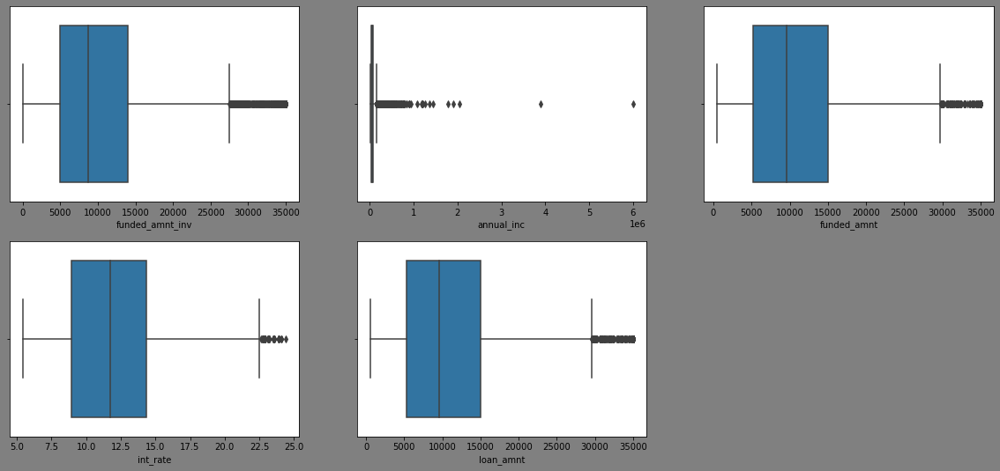

In [62]:
plt.figure(figsize=(20,9),facecolor='grey')
plt.subplot(2, 3, 1)
sns.boxplot(loans_data.funded_amnt_inv)
plt.subplot(2, 3, 2)
sns.boxplot(loans_data.annual_inc)
plt.subplot(2, 3, 3)
sns.boxplot(loans_data.funded_amnt)
plt.subplot(2, 3, 4)
sns.boxplot(loans_data.int_rate)
plt.subplot(2, 3, 5)
sns.boxplot(loans_data.loan_amnt)

#### From the above plot we can observe that annual_inc has high percentage of outliers. So, lets remove the outliers for annual_inc column

In [61]:
#### Check quantiles for annual_inc column 
loans_data["annual_inc"].describe()

count     38577.00
mean      68777.97
std       64218.68
min        4000.00
25%       40000.00
50%       58868.00
75%       82000.00
max     6000000.00
Name: annual_inc, dtype: float64

In [65]:
Q1 = loans_data["annual_inc"].quantile(0.25)
Q3 = loans_data["annual_inc"].quantile(0.75)
IQR = Q3 - Q1
Q1,Q3,IQR

(40000.0, 82000.0, 42000.0)

In [70]:
loans_data["annual_inc"] = loans_data["annual_inc"][~((loans_data["annual_inc"] < (Q1 - 1.5 * IQR)) | (loans_data["annual_inc"] > (Q3 + 1.5 * IQR)))]
loans_data["annual_inc"].describe()

count    36815.00
mean     61218.19
std      28224.58
min       4000.00
25%      40000.00
50%      56000.00
75%      78000.00
max     145000.00
Name: annual_inc, dtype: float64

#### From the above result we can observe that outliers are removed from annual_inc column!!

# Step 3 - Data visualization

# Univariate Analysis

#### loan_status

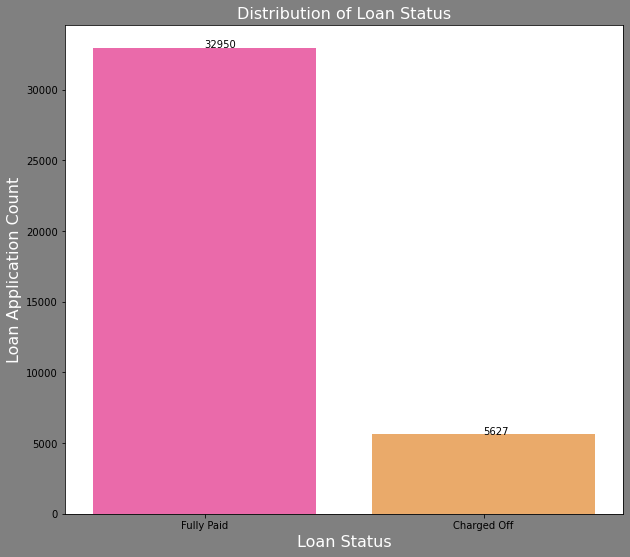

In [76]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
ax = sns.countplot(x="loan_status",data=loans_data,palette='spring')
ax.set_title('Distribution of Loan Status',fontsize=16,color='w')
ax.set_xlabel('Loan Status',fontsize=16,color = 'w')
ax.set_ylabel('Loan Application Count',fontsize=16,color = 'w')            
# To show count of values above bars
s=loans_data['loan_status'].value_counts()
for i, v in s.reset_index().iterrows():
    ax.text(i, v.loan_status + 0.3 , v.loan_status, color='k')

#### purpose

Text(0, 0.5, 'Purpose Count')

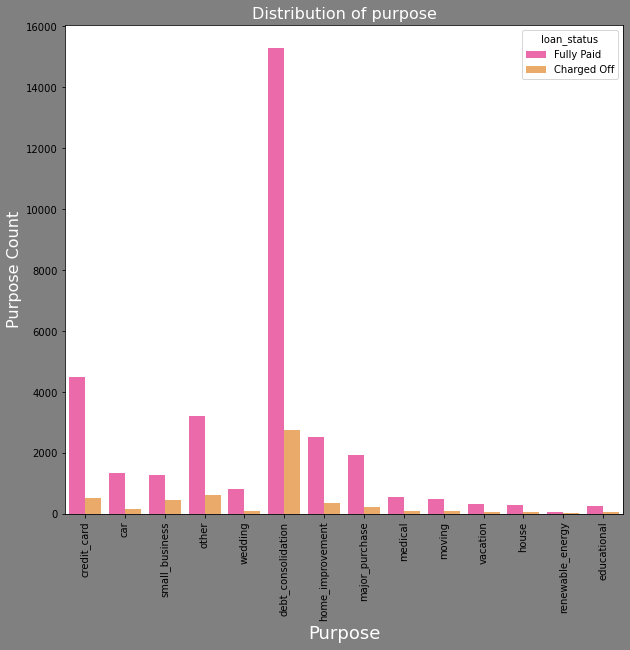

In [77]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.xticks(rotation=90)
ax = sns.countplot(x="purpose",data=loans_data,hue='loan_status',palette='spring')
ax.set_title('Distribution of purpose',fontsize=16,color='w')
ax.set_xlabel('Purpose',fontsize=18,color = 'w')
ax.set_ylabel('Purpose Count',fontsize=16,color = 'w')

#### issue_date_year

Text(0, 0.5, 'Issue Date Year Count')

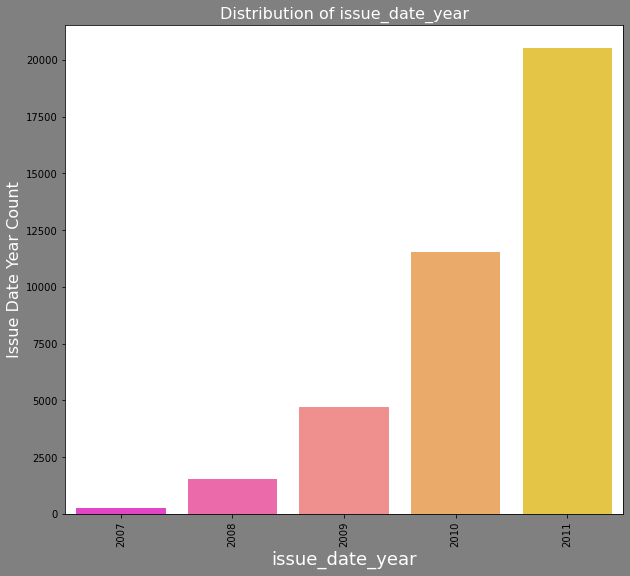

In [78]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.xticks(rotation=90)
ax = sns.countplot(x="issue_date_year",data=loans_data,palette='spring')
ax.set_title('Distribution of issue_date_year',fontsize=16,color='w')
ax.set_xlabel('issue_date_year',fontsize=18,color = 'w')
ax.set_ylabel('Issue Date Year Count',fontsize=16,color = 'w') 

#### issue_date_month

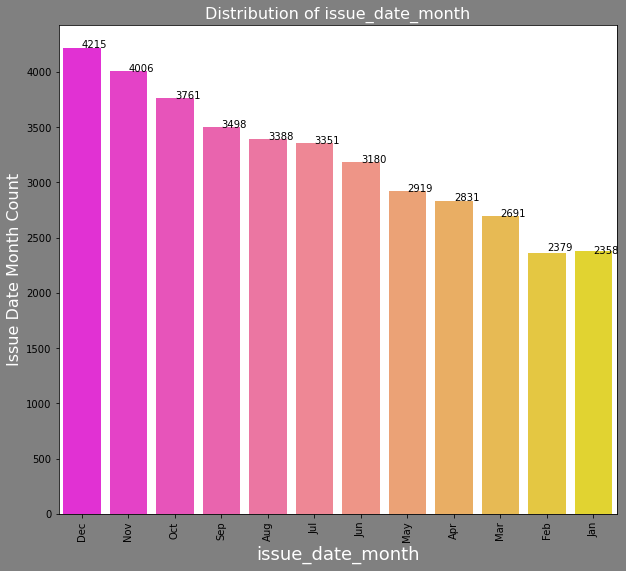

In [79]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.xticks(rotation=90)
ax = sns.countplot(x="issue_date_month",data=loans_data,palette='spring')
ax.set_title('Distribution of issue_date_month',fontsize=16,color='w')
ax.set_xlabel('issue_date_month',fontsize=18,color = 'w')
ax.set_ylabel('Issue Date Month Count',fontsize=16,color = 'w')            
# To show count of values above bars
s=loans_data['issue_date_month'].value_counts()
for i, v in s.reset_index().iterrows():
    ax.text(i, v.issue_date_month + 0.3 , v.issue_date_month, color='k')

#### term

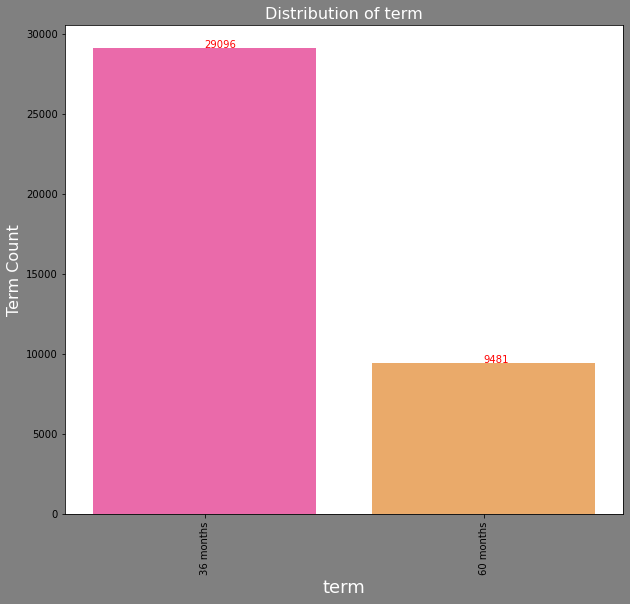

In [81]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.xticks(rotation=90)
ax = sns.countplot(x="term",data=loans_data,palette='spring')
ax.set_title('Distribution of term',fontsize=16,color='w')
ax.set_xlabel('term',fontsize=18,color = 'w')
ax.set_ylabel('Term Count',fontsize=16,color = 'w')            
# To show count of values above bars
s=loans_data['term'].value_counts()
for i, v in s.reset_index().iterrows():
    ax.text(i, v.term + 0.3 , v.term, color='r')

#### grade

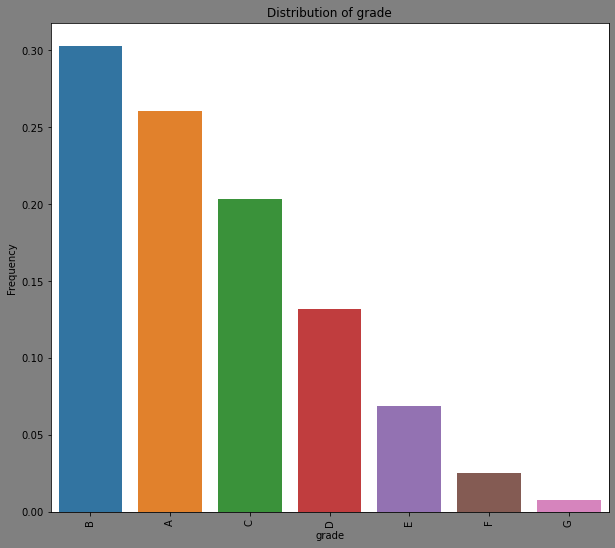

In [83]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.xticks(rotation=90)
new_df = loans_data['grade'].value_counts(normalize=True).reset_index()
sns.barplot(x='index', y='grade', data=new_df)
plt.xlabel('grade')
plt.ylabel('Frequency')
plt.title('Distribution of grade')
plt.xticks(rotation=90)
plt.show()

#### emp_length

<Figure size 720x648 with 0 Axes>

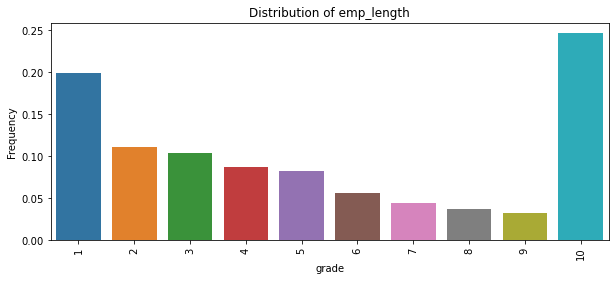

In [84]:
#Setting the figure size
plt.figure(figsize=(10,9),facecolor='grey')
plt.figure(figsize=(10,4))
new_df = loans_data['emp_length'].value_counts(normalize=True).reset_index()
sns.barplot(x='index', y='emp_length', data=new_df)
plt.xlabel('grade')
plt.ylabel('Frequency')
plt.title('Distribution of emp_length')
plt.xticks(rotation=90)
plt.show()

#### verification_status

<Figure size 720x288 with 0 Axes>

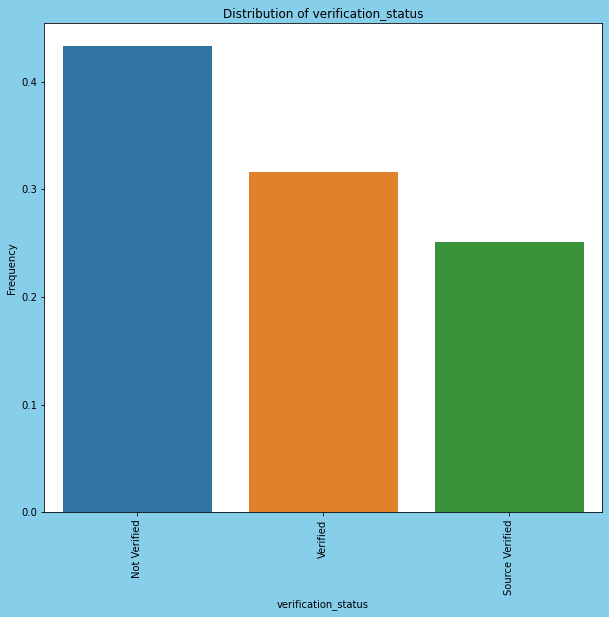

In [86]:
#Setting the figure size
plt.figure(figsize=(10,4))
plt.figure(figsize=(10,9),facecolor='skyblue')
new_df = loans_data['verification_status'].value_counts(normalize=True).reset_index()
sns.barplot(x='index', y='verification_status', data=new_df)
plt.xlabel('verification_status')
plt.ylabel('Frequency')
plt.title('Distribution of verification_status')
plt.xticks(rotation=90)
plt.show()

#### addr_state

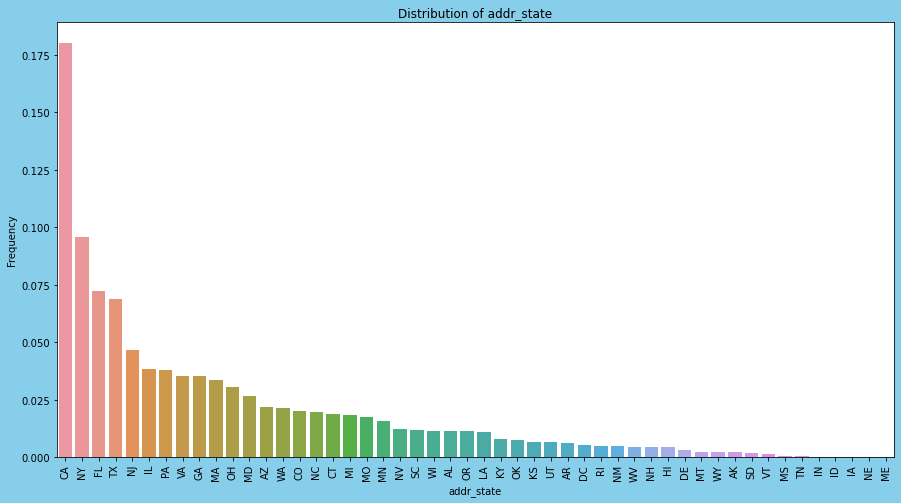

In [87]:
plt.figure(figsize=(15,8),facecolor='skyblue')
new_df = loans_data['addr_state'].value_counts(normalize=True).reset_index()
sns.barplot(x='index', y='addr_state', data=new_df)
plt.xlabel('addr_state')
plt.ylabel('Frequency')
plt.title('Distribution of addr_state')
plt.xticks(rotation=90)
plt.show()

#### home_ownership

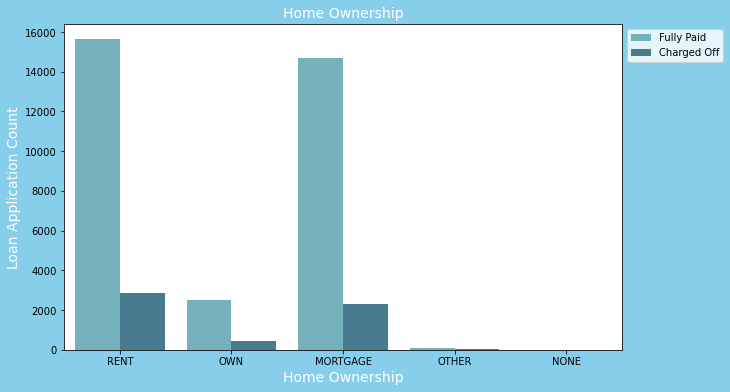

In [88]:
plt.figure(figsize=(10,6),facecolor='skyblue')
ax = sns.countplot(x="home_ownership",data=loans_data,hue='loan_status',palette='GnBu_d')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Home Ownership',fontsize=14,color='w')
ax.set_xlabel('Home Ownership',fontsize=14,color = 'w')
ax.set_ylabel('Loan Application Count',fontsize=14,color = 'w')
plt.show()

#### funded_amnt

Text(0, 0.5, 'Funded Amount Proportion')

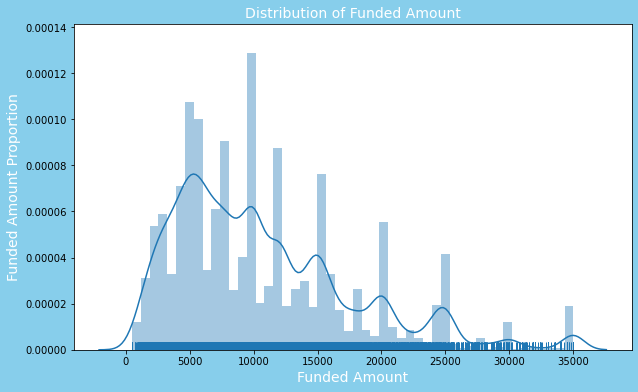

In [89]:
plt.figure(figsize=(10,6),facecolor='skyblue')
ax = sns.distplot(loans_data['funded_amnt'],rug = True)
ax.set_title('Distribution of Funded Amount',fontsize=14,color='w')
ax.set_xlabel('Funded Amount',fontsize=14,color = 'w')
ax.set_ylabel('Funded Amount Proportion',fontsize=14,color = 'w')

#### funded_amnt_inv

Text(0, 0.5, 'Funded Amount Investment Proportion')

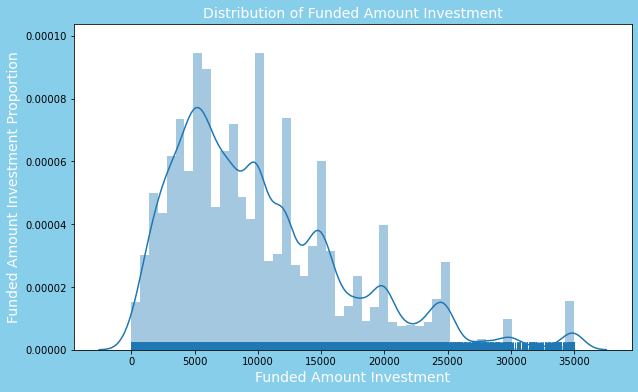

In [91]:
plt.figure(figsize=(10,6),facecolor='skyblue')
ax = sns.distplot(loans_data['funded_amnt_inv'],rug = True)
ax.set_title('Distribution of Funded Amount Investment',fontsize=14,color='w')
ax.set_xlabel('Funded Amount Investment',fontsize=14,color = 'w')
ax.set_ylabel('Funded Amount Investment Proportion',fontsize=14,color = 'w')

#### annual_inc

Text(0, 0.5, 'Annual Income proportion')

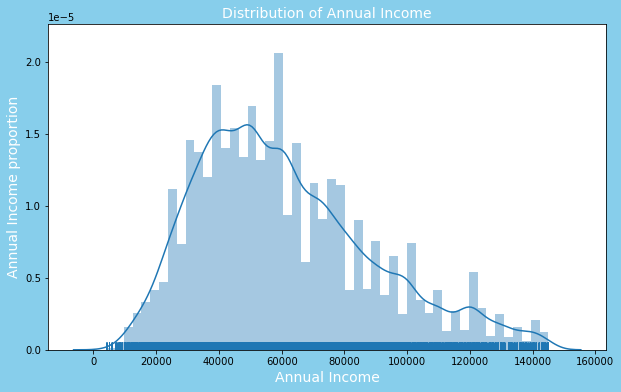

In [93]:
plt.figure(figsize=(10,6),facecolor='skyblue')
ax = sns.distplot(loans_data['annual_inc'],rug = True)
ax.set_title('Distribution of Annual Income',fontsize=14,color='w')
ax.set_xlabel('Annual Income',fontsize=14,color = 'w')
ax.set_ylabel('Annual Income proportion',fontsize=14,color = 'w')

## Bivariate Analysis 

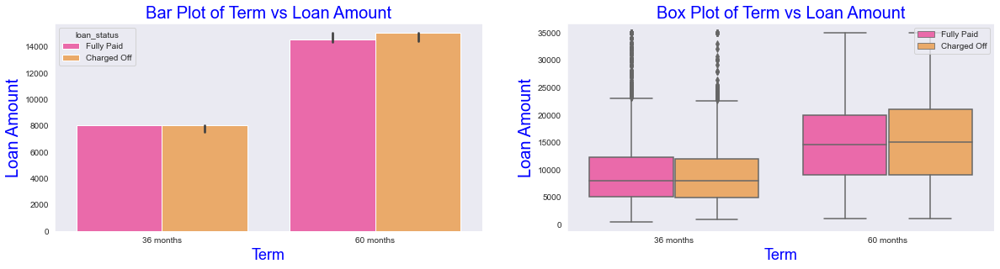

In [139]:
# Bivariate Analysis - Term vs Loan Amount
# Box Plot

plt.figure(figsize=(20,10))
sns.set_style("dark")
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='term', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot of Term vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='term', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot of Term vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

### Users with term duration of 60 months have maximum loan amount with more chances to default.

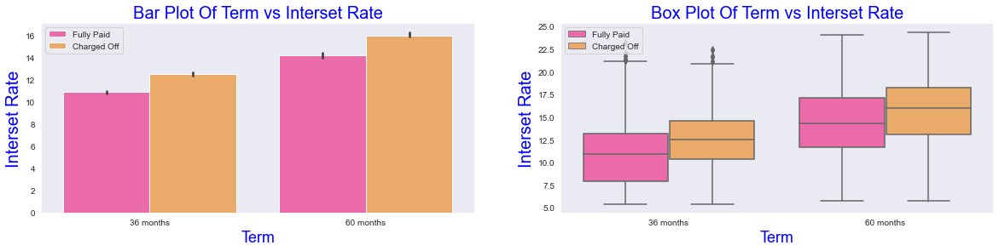

In [142]:
# Bivariate Analysis - Term vs Interest Rate
# Box Plot
plt.figure(figsize=(20,9))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='term', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Term vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='term', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Term vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

### Interset rate increases as we increase term duration and there are more chances likely to get default.

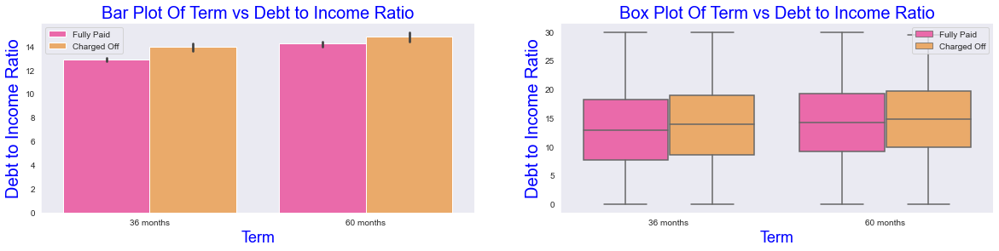

In [146]:
# Bivariate Analysis - Term vs Debt to Income Ratio
# Box Plot
plt.figure(figsize=(20,9))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='term', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Term vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='term', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Term vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Debt to Income Ratio is high for 60 months term duration and this may lead to chance of default.

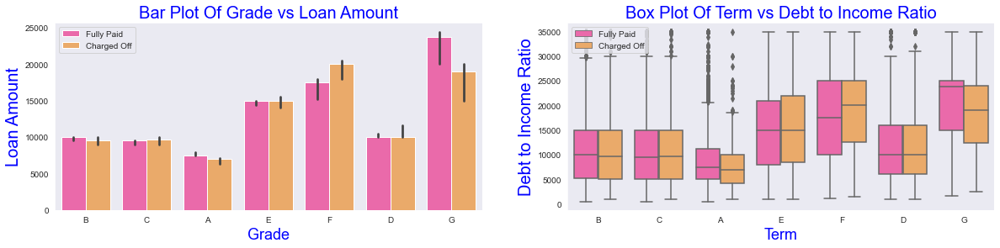

In [148]:
# Bivariate Analysis - Grade vs Loan Amount
plt.figure(figsize=(20,9))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='grade', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Bar Plot Of Grade vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Grade',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='grade', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Term vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Term',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

#### Users with low grades have high chance to get default.

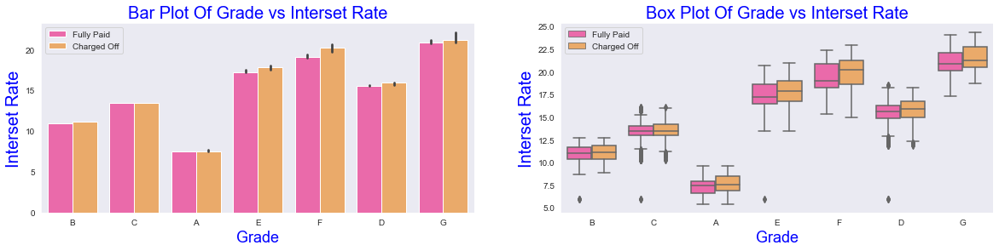

In [154]:
# Bivariate Analysis - Grade vs Interest Rate
plt.figure(figsize=(20,9))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='grade', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Grade vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Grade',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='grade', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Grade vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Grade',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

#### Users with low grades are facing high interests and more likely to default

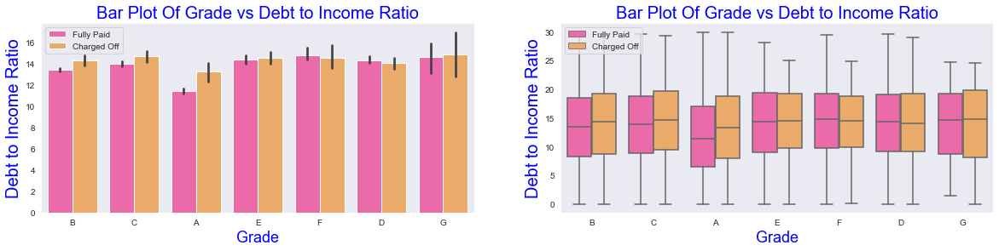

In [155]:
# Bivariate Analysis - Grade vs Debt to Income Ratio
plt.figure(figsize=(20,9))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='grade', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Grade vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Grade',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='grade', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Bar Plot Of Grade vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Grade',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

#### Debt to Income Ratio does not have much impact on grades.

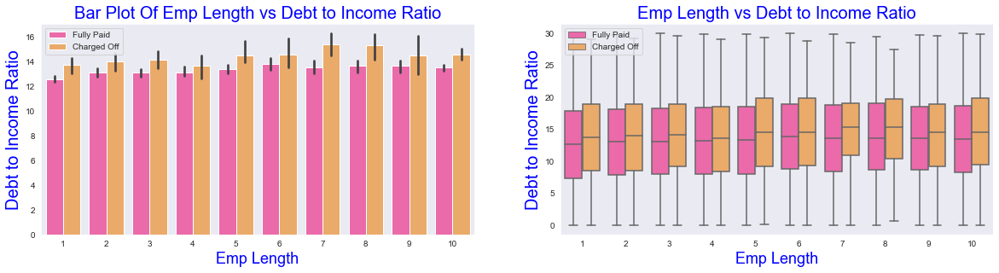

In [159]:
# Bivariate Analysis - Emp Length vs Debt to Income Ratio
plt.figure(figsize=(20,10))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='emp_length', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Bar Plot Of Emp Length vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='emp_length', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.legend(bbox_to_anchor=(1, 1))
ax.set_title('Emp Length vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

#### Employee length does not have much impact on dti.

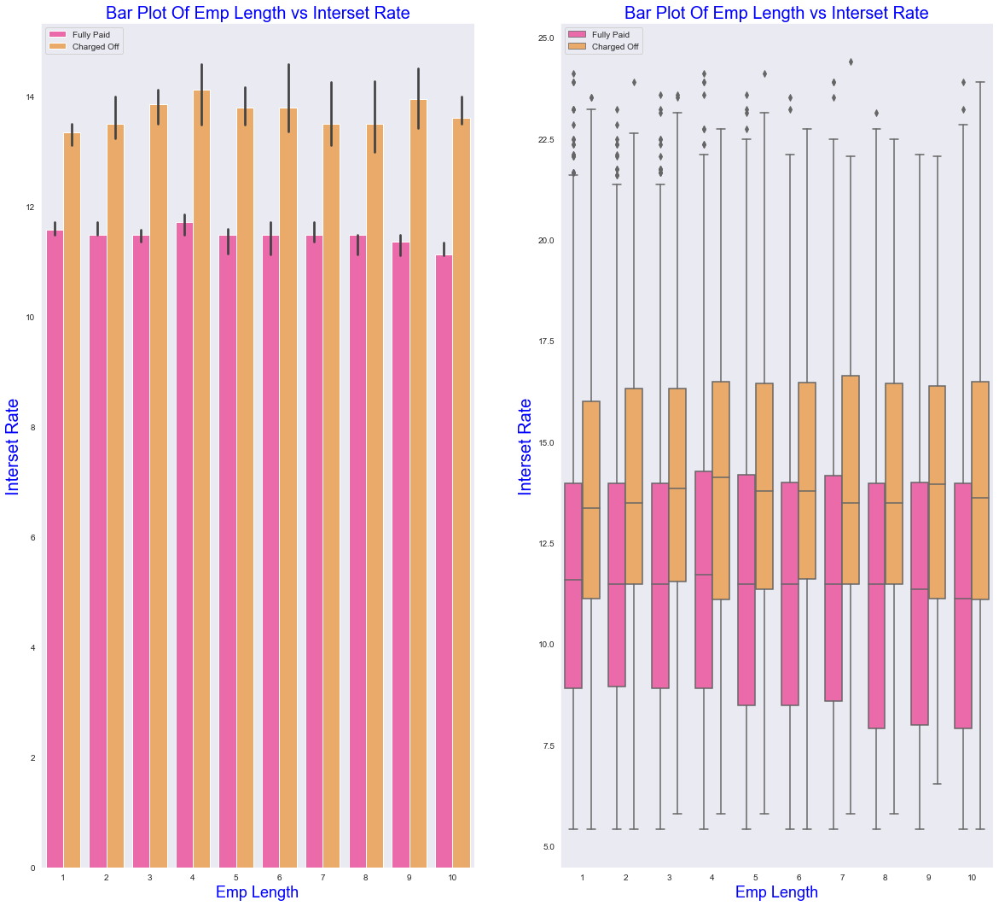

In [189]:
# Bivariate Analysis - Emp Length vs Interest Rate
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='emp_length', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Emp Length vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='emp_length', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Bar Plot Of Emp Length vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper left')
plt.show()

#### Employee length do not have much impact on interest rate

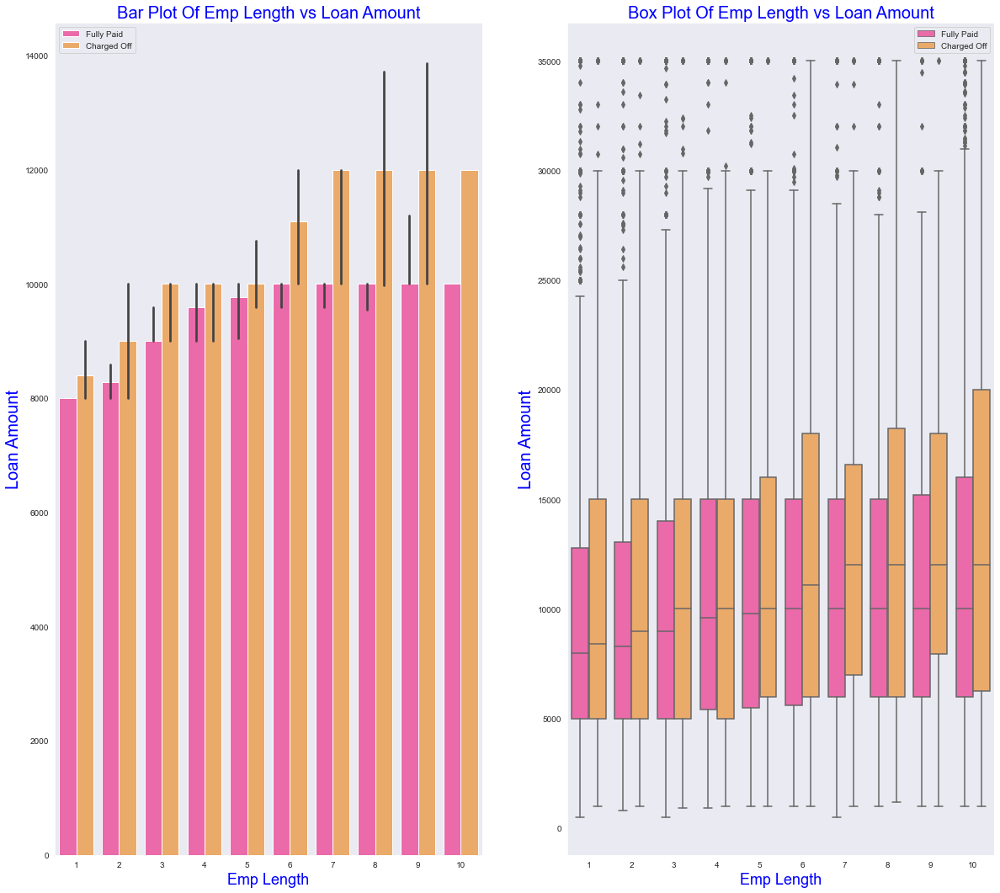

In [188]:
# Bivariate Analysis - Emp Length vs Loan Amount
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='emp_length', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Emp Length vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='emp_length', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Emp Length vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Emp Length',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Users with high years of experience took max loan and more likely to get defaulut.

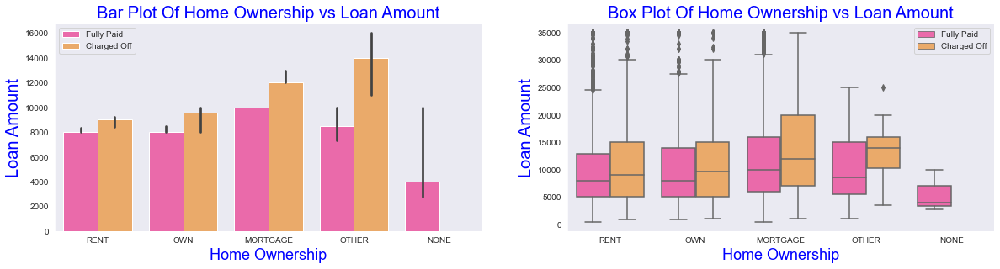

In [170]:
# Bivariate Analysis - Home Ownership vs Loan Amount
plt.figure(figsize=(20,10))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='home_ownership', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Home Ownership vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=18,color = 'b')
plt.legend(loc='upper left')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='home_ownership', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Home Ownership vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Users with Home ownership (Other & Mortage) took max loan amount and more likely to get default.

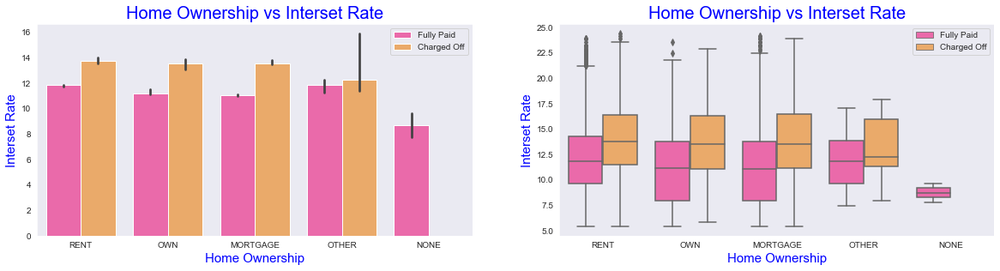

In [173]:
# Bivariate Analysis - Home Ownership vs Interest Rate
plt.figure(figsize=(20,10))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='home_ownership', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Home Ownership vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=15,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=15,color = 'b')
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='home_ownership', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Home Ownership vs Interset Rate',fontsize=20,color='b')
ax.set_ylabel('Interset Rate',fontsize=15,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=15,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Interset rate does not have much impact on home ownership.

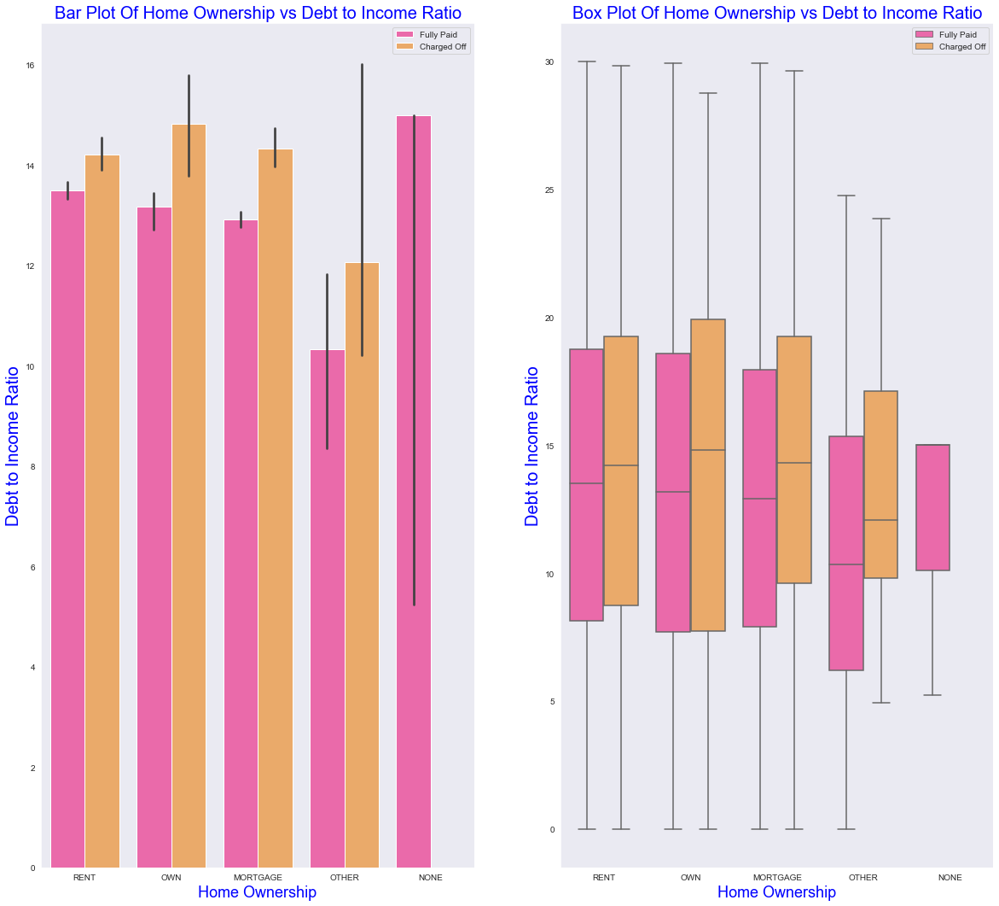

In [186]:
# Bivariate Analysis - Home Ownership vs Debt to Income Ratio
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='home_ownership', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Home Ownership vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=18,color = 'b')
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='home_ownership', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Home Ownership vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Home Ownership',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Users with Home ownership as OTHER have more dti and more likely to get default.

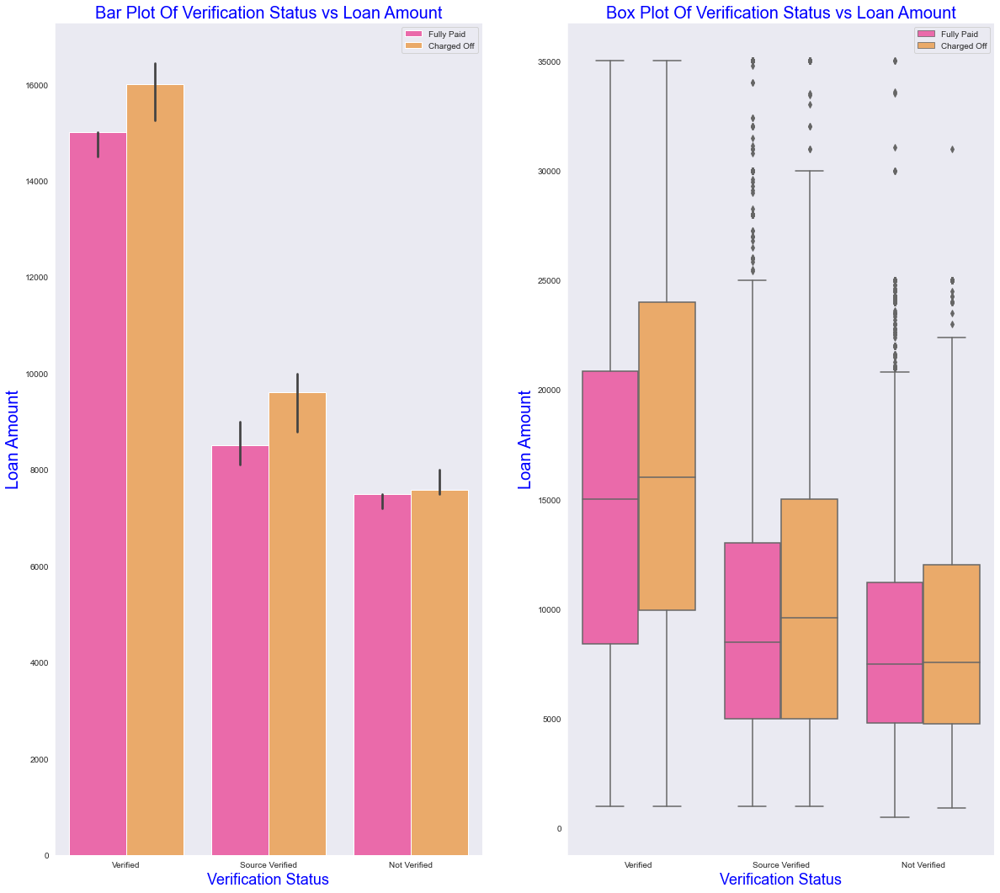

In [185]:
# Bivariate Analysis - Verification Status vs Loan Amount
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='verification_status', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Verification Status vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='verification_status', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Verification Status vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Most of the users who opt for loan are verified and more likely to get default.

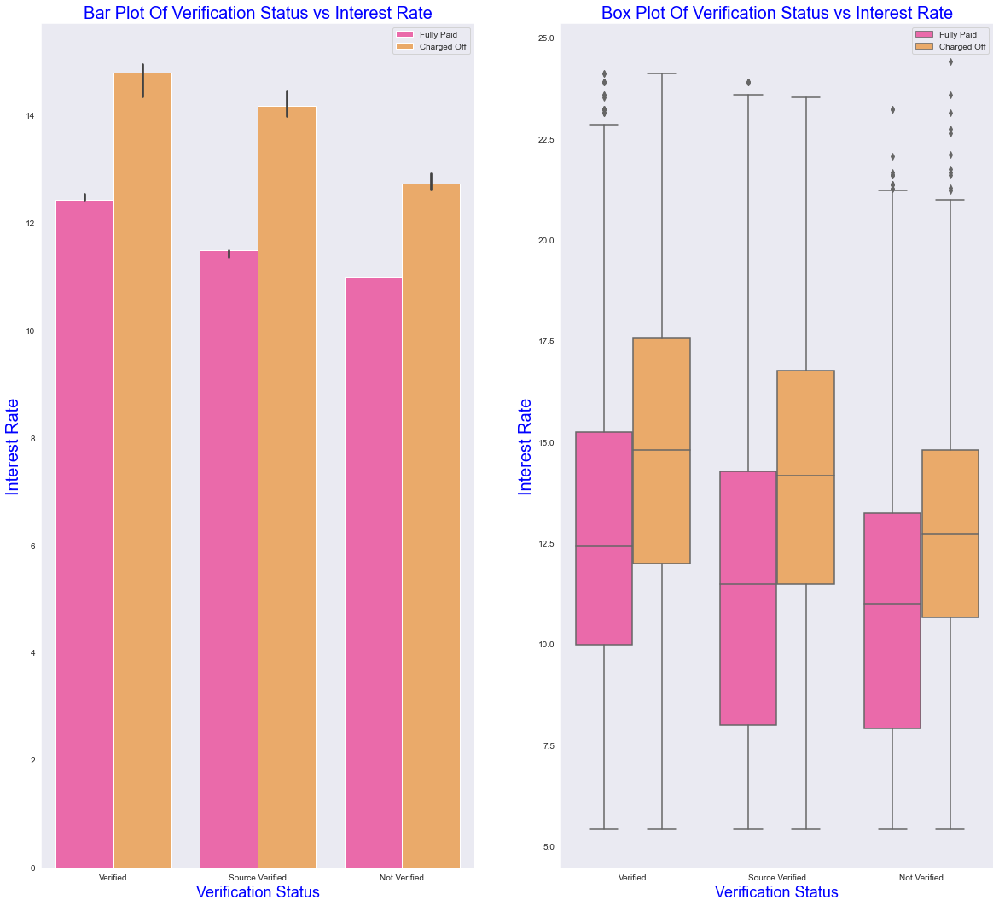

In [184]:
# Bivariate Analysis - Verification Status vs Interest Rate
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='verification_status', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Verification Status vs Interest Rate',fontsize=20,color='b')
ax.set_ylabel('Interest Rate',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='verification_status', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Verification Status vs Interest Rate',fontsize=20,color='b')
ax.set_ylabel('Interest Rate',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### Interest Rate does not have much impact on verification status

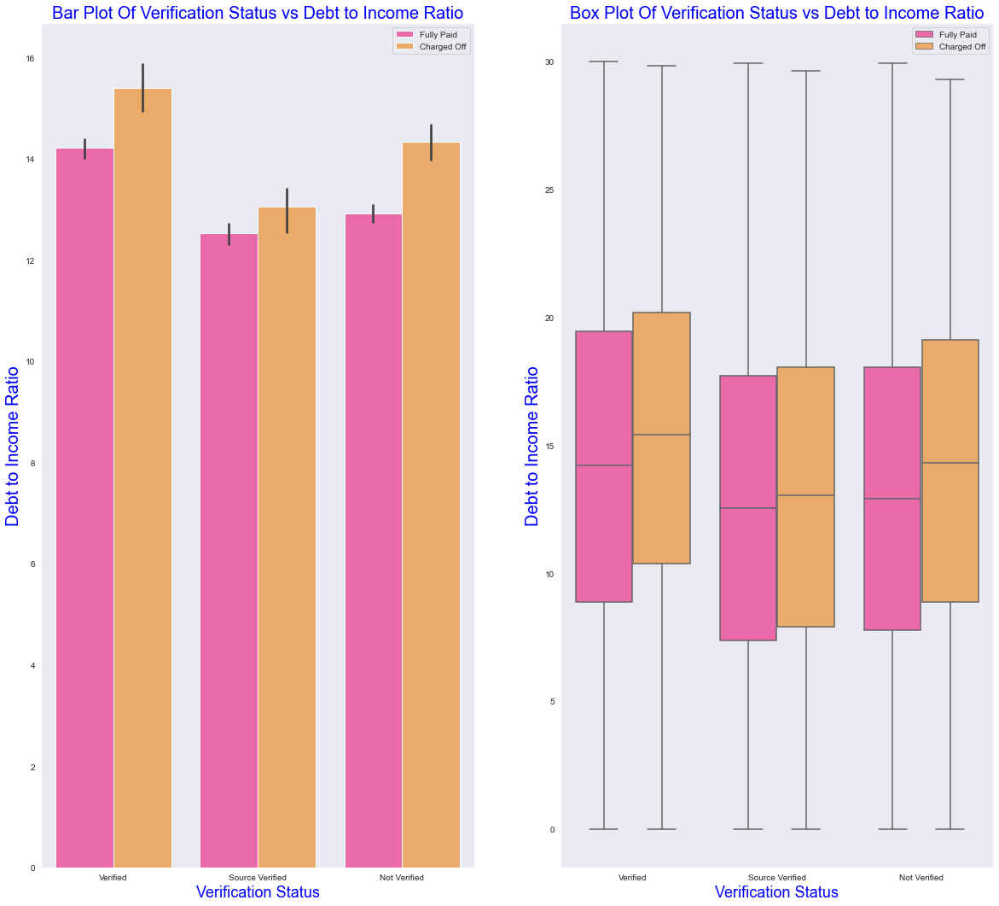

In [183]:
# Bivariate Analysis - Verification Status vs Debt to Income Ratio
plt.figure(figsize=(20,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='verification_status', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Verification Status vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='verification_status', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Verification Status vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Verification Status',fontsize=18,color = 'b')
plt.legend(loc='upper right')
plt.show()

#### All verified users have high dti and more likely to get default.

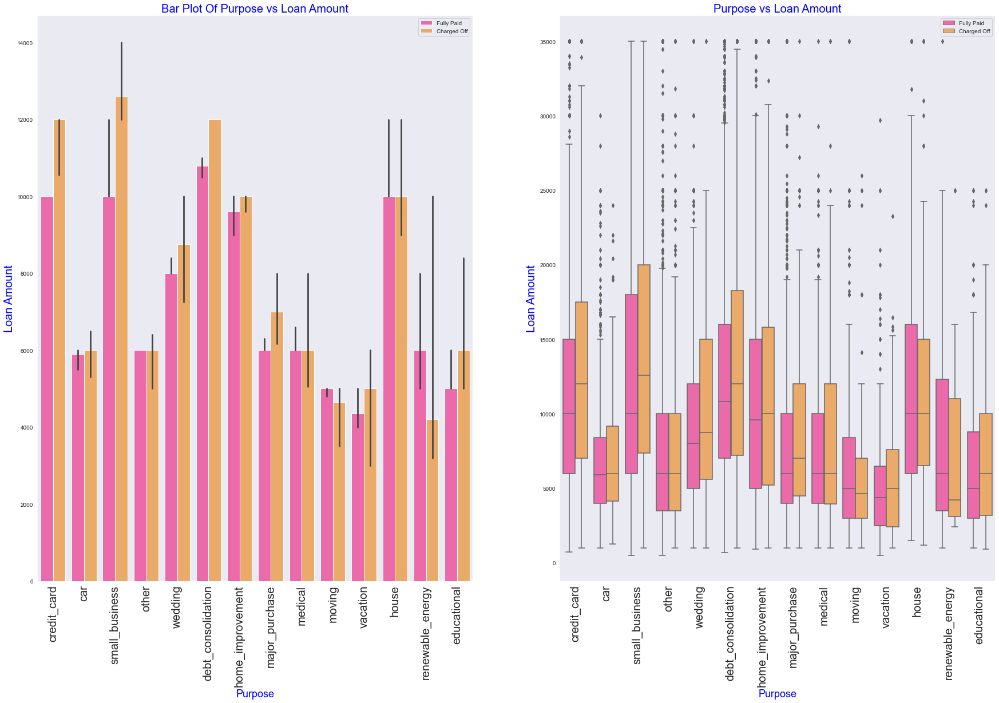

In [191]:
# Bivariate Analysis - Purpose vs Loan Amount
plt.figure(figsize=(30,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='purpose', y='loan_amnt', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Purpose vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='purpose', y='loan_amnt', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Purpose vs Loan Amount',fontsize=20,color='b')
ax.set_ylabel('Loan Amount',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
plt.show()

#### Users who took loan with Purpose as (SMALL BUSINESS,DEBT CONSOLIDATION) recorded with maximum loan amount and more likely to get default.

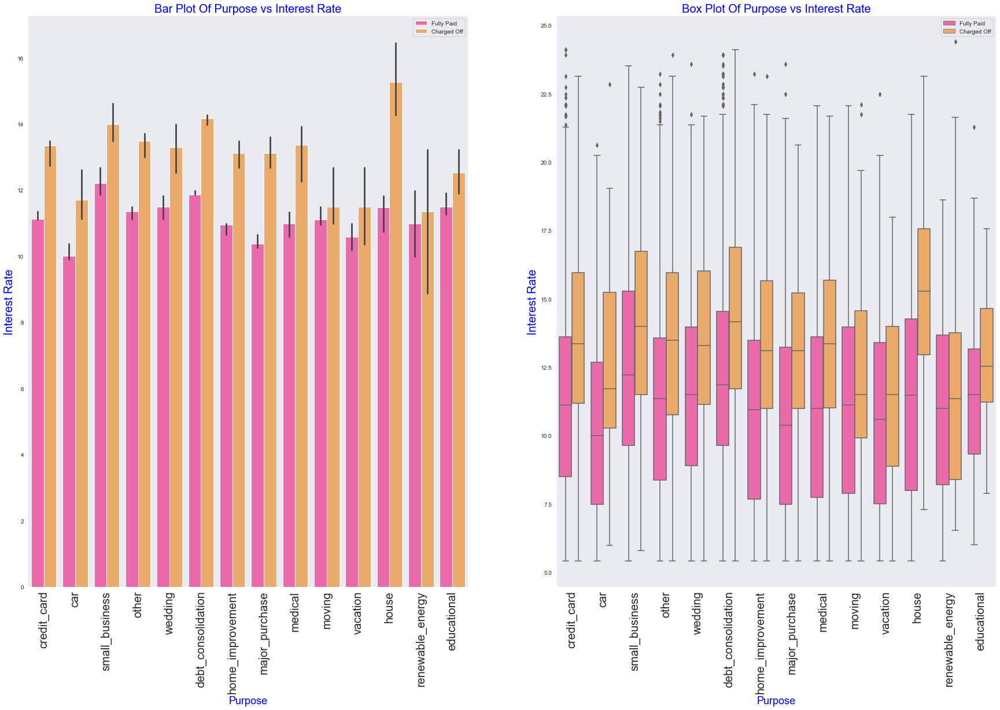

In [193]:
# Bivariate Analysis - Purpose vs Interest Rate
plt.figure(figsize=(30,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='purpose', y='int_rate', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Purpose vs Interest Rate',fontsize=20,color='b')
ax.set_ylabel('Interest Rate',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='purpose', y='int_rate', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Purpose vs Interest Rate',fontsize=20,color='b')
ax.set_ylabel('Interest Rate',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
plt.show()

#### Interst Rate & Purpose does not have much impact on each other

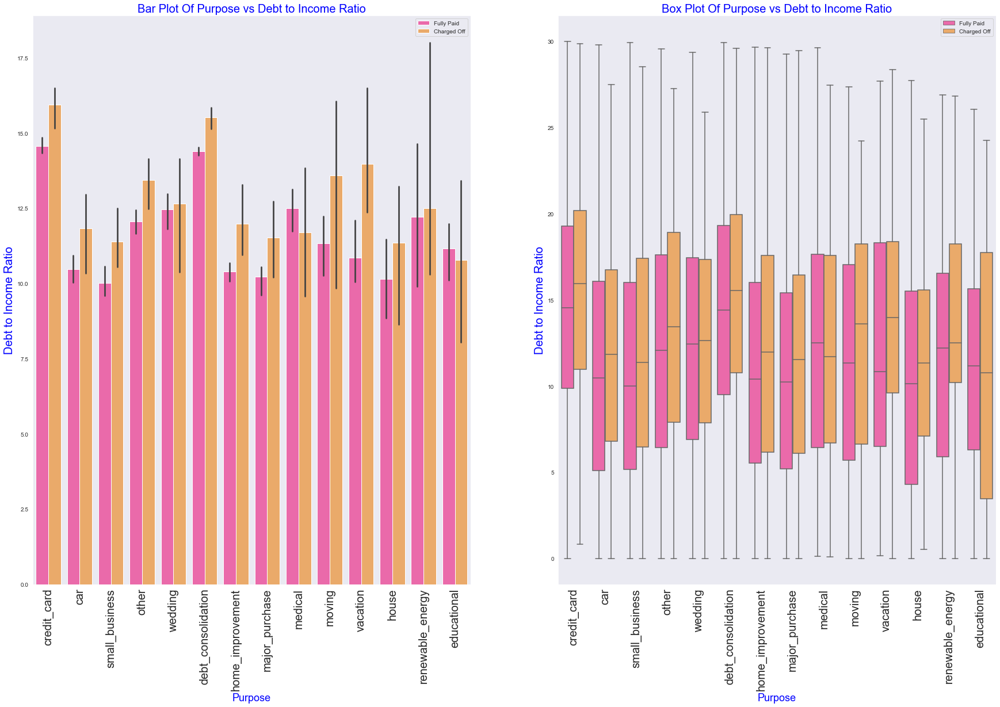

In [194]:
# Bivariate Analysis - Purpose vs Debt to Income Ratio
plt.figure(figsize=(30,40))
# subplot 1
plt.subplot(2, 2, 1)
ax = sns.barplot(x='purpose', y='dti', hue='loan_status', data=loans_data, estimator=np.median,palette='spring')
ax.set_title('Bar Plot Of Purpose vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
# subplot 2
plt.subplot(2, 2, 2)
ax = sns.boxplot(x='purpose', y='dti', hue='loan_status', data=loans_data,palette='spring')
ax.set_title('Box Plot Of Purpose vs Debt to Income Ratio',fontsize=20,color='b')
ax.set_ylabel('Debt to Income Ratio',fontsize=20,color = 'b')
ax.set_xlabel('Purpose',fontsize=18,color = 'b')
plt.xticks(rotation=90,fontsize=20)
plt.legend(loc='upper right')
plt.show()

#### Users who took loan with Purpose as (CREDIT CARD,DEBT CONSOLIDATION) recorded with maximum Debt to Income Ratio and more likely to get default.

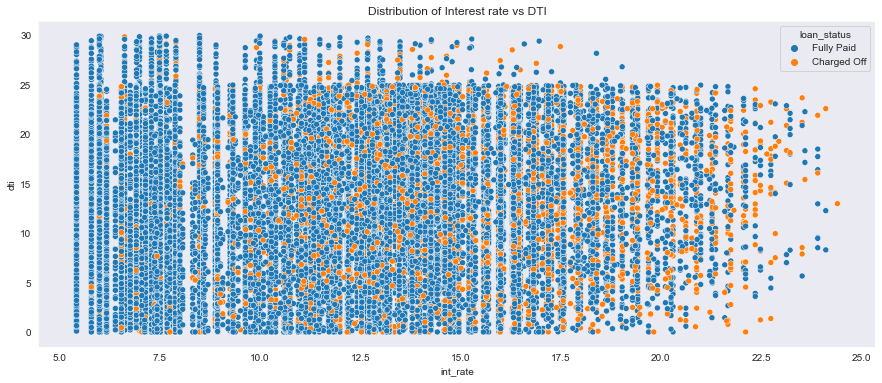

In [195]:
plt.figure(figsize=(15,6))
sns.scatterplot(x='int_rate', y='dti', data=loans_data, hue='loan_status')
plt.title('Distribution of Interest rate vs DTI')
plt.show()

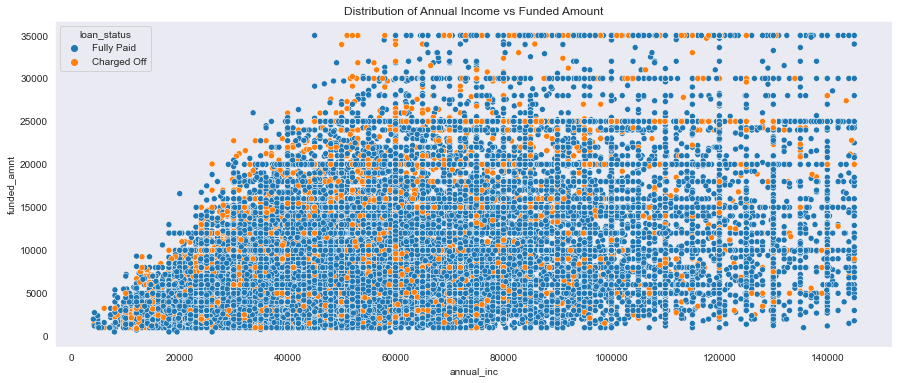

In [197]:
plt.figure(figsize=(15,6))
sns.scatterplot(x='annual_inc', y='funded_amnt', data=loans_data, hue='loan_status')
plt.title('Distribution of Annual Income vs Funded Amount')
plt.show()

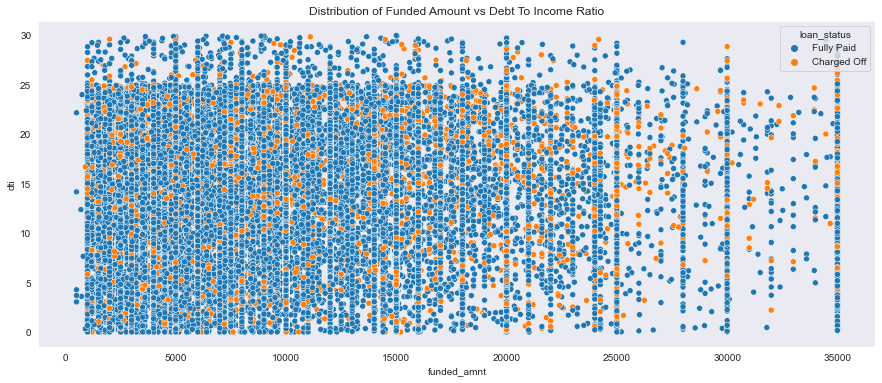

In [207]:
plt.figure(figsize=(15,6))
sns.scatterplot(x='funded_amnt', y='dti', data=loans_data, hue='loan_status')
plt.title('Distribution of Funded Amount vs Debt To Income Ratio')
plt.show()

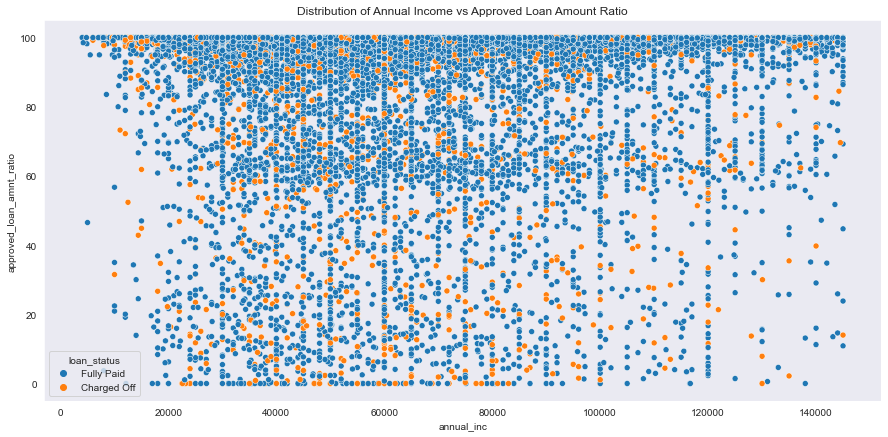

In [206]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='annual_inc', y='approved_loan_amnt_ratio', data=loans_data, hue='loan_status')
plt.title('Distribution of Annual Income vs Approved Loan Amount Ratio')
plt.show()

#### All the above plots are widely spread across the graph which doesn't give valid observation

## Multi variate Analysis - Pair plot

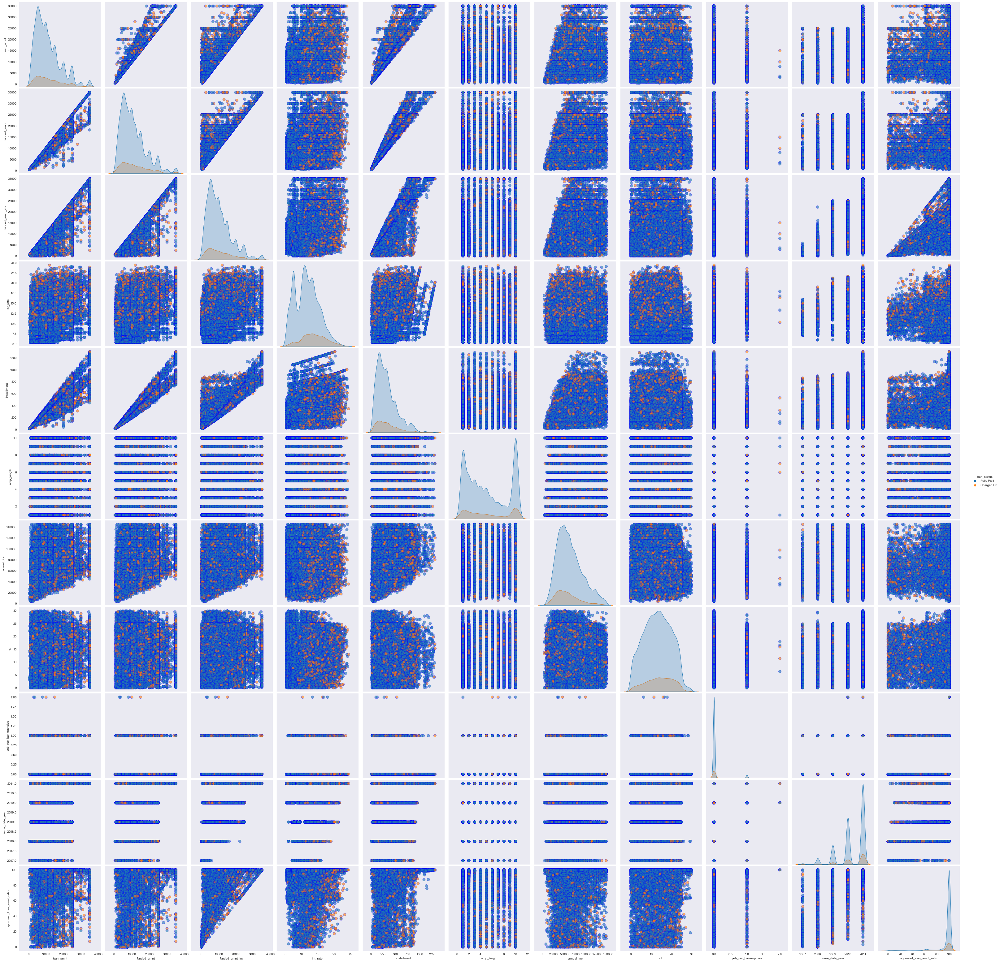

In [208]:
# Multivariate Analysis 
sns.pairplot(loans_data, hue = 'loan_status', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'b'},
             size = 4)
plt.show()

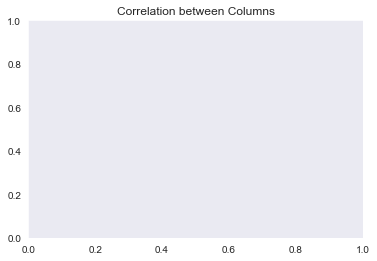

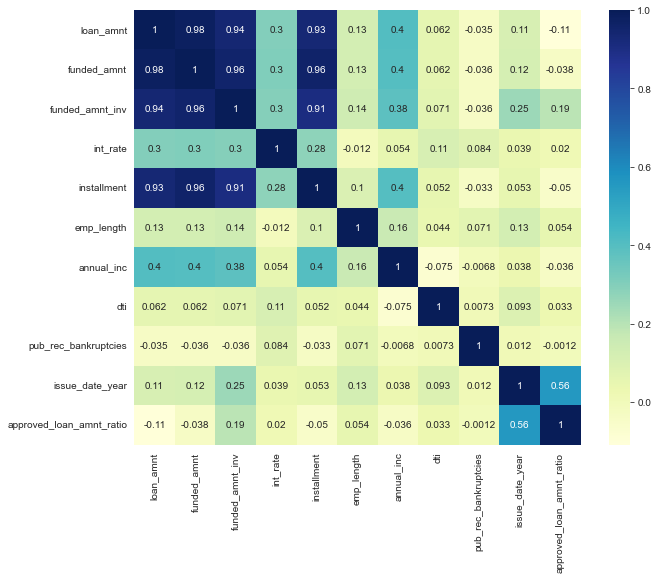

In [209]:
#Finding correlation matric
corr_matrix = loans_data.corr()
plt.title("Correlation between Columns")
#Plotting Heat map to understand correlation visually
plt.figure(figsize=(10,8))
# heatmap
sns.heatmap(corr_matrix, cmap="YlGnBu", annot=True)
plt.show()

**Result from above plot**:  
loan_amnt,funded_amnt,funded_amnt_inv are positively correlated wih each other .

## Conclusions 
#### 1. Consumer finance company should reduce the high interest loans for 60 months tenure because they are prone to loan default.
#### 2. Proper verification should be done while issuing loans to low grade people because they are more likely to become default as their income is very less but interest rate is very high.
#### 3. Company should carefully analyse the address states of the people as we can see in our dataset majority of the people are from CA, NY, FL.
#### 4. Loans given to small business, debt consolidation and credit card has higher proportion to default the loan. So, company should examine the purpose belonging to this carefully.
#### 5. Irrespective of Home owner ship, when the interest rate is high the default rate also high. Ownership of other category has higher proportion to default the loan.
#### 6. Other Ownership category have higher proportion to default the loan. loan_amnt, funded_amnt, funded_amnt_inv are positively correlated with each other